In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

print(np.__version__)
print(tf.__version__)

1.18.5
2.1.3


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

print(np.__version__)
print(tf.__version__)
print(cv2.__version__)

def load_data(path,size):
    high_res_images = []
    low_res_images = []
    count = 0
    for (dirname, _, filenames_high_res),(dirname, _, filenames_low_res) in zip(os.walk(path+'HIGH'),os.walk(path+'LOW')):
        filenames_high_res.sort()
        filenames_low_res.sort()
        
        for filename_high,filename_low in zip(filenames_high_res,filenames_low_res):
            #faulty image
            
            try:
                count+=1
                img = cv2.imread(os.path.join(dirname, filename_high))
                img_2 = cv2.imread(os.path.join(dirname, filename_low))
                # resizing the images
                width=int(img.shape[1])
                height=int(img.shape[0])
                
                width_2= int(img_2.shape[1])
                height_2=int(img_2.shape[0]) 
            
                if width!= 512 and height !=512:
                    dsize=(512,512)
                    img=cv2.resize(img,dsize)
                  
                if width_2!= 256 and height_2 !=256:
                    dsize=(256,256)
                    dsize_1 = (128,128)
                    img_2 = cv2.resize(img_2,dsize_1,interpolation=cv2.INTER_AREA)
                    img_2 = cv2.resize(img_2,dsize,interpolation=cv2.INTER_AREA)
                    #img_2=cv2.resize(img_2,dsize)
                    img_2 = np.array(img_2)+ np.random.rand(256,256,3)*50
                
                img = process_image(img)
                img_2 = process_image(img_2)
                high_res_images.append(img)
                low_res_images.append(img_2)
            except:
                continue
            if count >size:
                break
    
    # zero-mean and zero-center the standard deviations ....
    low_res_array = np.array(low_res_images)
    #mean_centered_low_res = (low_res_array - low_res_array.mean())/low_res_array.std()
    
    # zero-mean and zero-center the standard deviations .....
    high_res_array = np.array(high_res_images)
    #mean_centered_high_res = (high_res_array - high_res_array.mean())/high_res_array.std()
    
    
    #return mean_centered_low_res, mean_centered_high_res
    return low_res_array,high_res_array

def process_image(image):
    return image/255

1.18.5
2.1.3
4.5.1


In [3]:
base_dir = ''
train_x, train_y =  load_data(path=base_dir+'Training/',size=7000)
val_x, val_y = load_data(path=base_dir+'Validationing/',size=7000)

In [4]:
train_x.shape

(7000, 256, 256, 3)

In [5]:
val_x.shape

(255, 256, 256, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


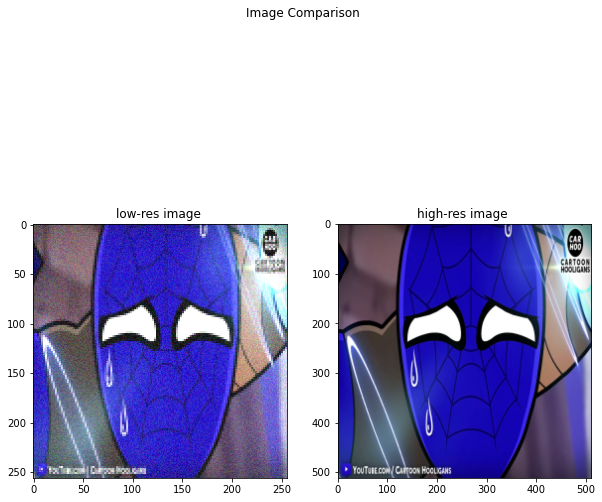

In [6]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(10,10))
fig.suptitle('Image Comparison')
ax1.imshow(train_x[2000])
ax1.title.set_text("low-res image ")
ax2.imshow(train_y[2000])
ax2.title.set_text("high-res image ")

In [26]:
# Convolutional Autoencoders for super resolution enhancement
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add,BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
import tensorflow as tf
import tensorflow.keras as keras

def build_model():
    input_img = Input(shape=(256, 256, 3))
    l1 = Conv2D(64, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
            kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(input_img)
    l2 = Conv2D(64, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
                kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l1)
    print('This is the l2\'s shape {}'.format(l2.shape))

    l3 = MaxPooling2D(padding='same')(l2)
    print(l3.shape)
    l3 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l3)
    #l3 = Dropout(0.3)(l3)
    l4 = Conv2D(128, (3, 3),  padding='same', activation='relu', bias_initializer='zeros',
                kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l3)
    l5 = Conv2D(128, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
                kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l4)
    print('This is L5 shape {}'.format(l5.shape))

    l6 = MaxPooling2D(padding='same')(l5)
    l6 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l6)
    l7 = Conv2D(256, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
                kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l6)
    print('This is L7 shape {}'.format(l7.shape))
    #l8 = UpSampling2D()(l7)
    l8 = Conv2DTranspose(128,(1,1),padding='same',strides=(2,2),activation='relu',bias_initializer='zeros',activity_regularizer=regularizers.l1(10e-10),
                        kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32),data_format='channels_last')(l7)
    # increasing the stide to 2,2 enables upsampling of the images
    print('This is L8 shape {}'.format(l8.shape))
    l8 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l8)
    #l8 = Dropout(0.3)(l8)
    l9 = Conv2D(128, (3, 3), padding='same', activation='relu',bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l8)
    l10 = Conv2D(128, (3, 3), padding='same', activation='relu',bias_initializer='zeros',
                 activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l9)
    l10 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l10)
    #l3 = Dropout(0.3)(l3)
    l11 = add([l5, l10])
    print('This is the l11 shape {}'.format(l11.shape))
    #l12 = UpSampling2D()(l11)
    l12 = Conv2DTranspose(128,(2,2),padding='same',strides=(2,2),activation='relu',bias_initializer='zeros',activity_regularizer=regularizers.l1(10e-10),
                        kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32),data_format='channels_last')(l11)
    
    print('This is the l12\'s shape {}'.format(l12.shape))
    
    l13 = Conv2D(64, (3, 3), padding='same', activation='relu',bias_initializer='zeros',
                 activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l12)
    l14 = Conv2D(64, (3, 3), padding='same', activation='relu',
                 activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l13)
    
    l14 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l14)
    l15 = add([l14, l2])
    l16 = Conv2DTranspose(64,(2,2),padding='same',strides=(2,2),activation='relu',bias_initializer='zeros',activity_regularizer=regularizers.l1(10e-10),
                        kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32),data_format='channels_last')(l15)
    l16 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l16)
    decoded = Conv2D(3, (3, 3), padding='same', activation='sigmoid', bias_initializer='zeros',
                     activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l16)

    print('This is the decoder\'s shape {}'.format(decoded.shape))
    model = Model(input_img, decoded)
    model.compile(optimizer=keras.optimizers.Adam(1e-4), loss='mean_squared_error')
    #model.compile(optimizer='adam', loss='mean_squared_error')
    #model.compile(optimizer=keras.optimizers.Adam(1e-4), loss='')
    return model

In [27]:
model_3 = build_model()
# train_x , train_y = train_x , train_y
# val_x , val_y = val_x, val_y

This is the l2's shape (None, 256, 256, 64)
(None, 128, 128, 64)
This is L5 shape (None, 128, 128, 128)
This is L7 shape (None, 64, 64, 256)
This is L8 shape (None, 128, 128, 128)
This is the l11 shape (None, 128, 128, 128)
This is the l12's shape (None, 256, 256, 128)
This is the decoder's shape (None, 512, 512, 3)


In [28]:
model_3.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 256, 256, 64) 1792        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 256, 256, 64) 36928       conv2d_19[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_4 (MaxPooling2D)  (None, 128, 128, 64) 0           conv2d_20[0][0]                  
____________________________________________________________________________________________

In [ ]:
def train(train_x, train_y, epochs = 1, batch_size = 14, shuffle = True):
    model_3.fit(train_x, train_y,epochs= epochs,batch_size=batch_size,shuffle=shuffle)
history_2= model_3.fit(train_x, train_y, validation_data =(val_x , val_y),epochs = 40, batch_size = 10, shuffle = True)

Train on 7000 samples, validate on 255 samples
Epoch 1/40
7000/7000 [==============================] - 783s 112ms/sample - loss: 0.0162 - val_loss: 0.0032
Epoch 2/40
7000/7000 [==============================] - 783s 112ms/sample - loss: 0.0161 - val_loss: 0.0030
Epoch 3/40
7000/7000 [==============================] - 783s 112ms/sample - loss: 0.0160 - val_loss: 0.0046
Epoch 4/40
7000/7000 [==============================] - 782s 112ms/sample - loss: 0.0160 - val_loss: 0.0029
Epoch 5/40
7000/7000 [==============================] - 783s 112ms/sample - loss: 0.0159 - val_loss: 0.0057
Epoch 6/40
3710/7000 [==============>...............] - ETA: 6:03 - loss: 0.0149

In [ ]:
model_3.save('CNN_06_02_512_BN_SIGMOID')

In [31]:
ten_ten= model_3.predict(val_x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


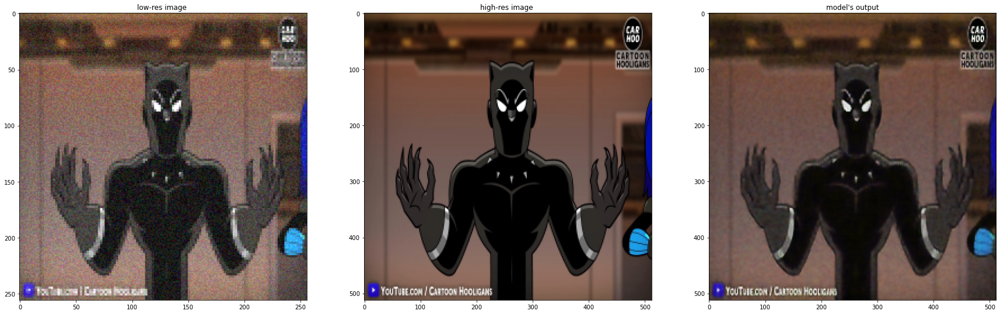

<Figure size 2880x2880 with 0 Axes>

In [37]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[179])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[179])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[179])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


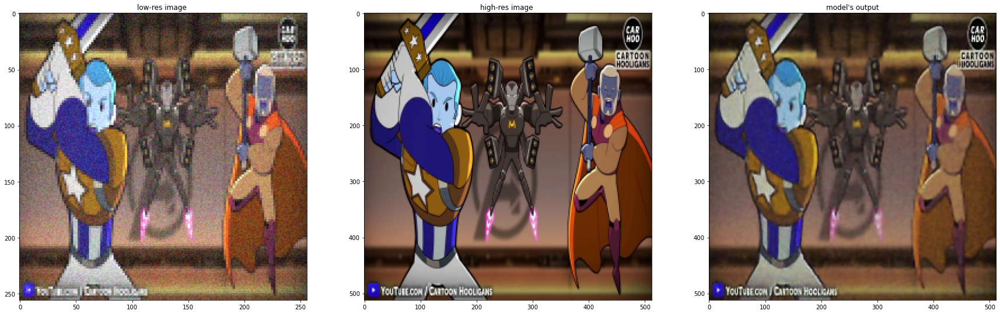

<Figure size 2880x2880 with 0 Axes>

In [32]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[100])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[100])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[100])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


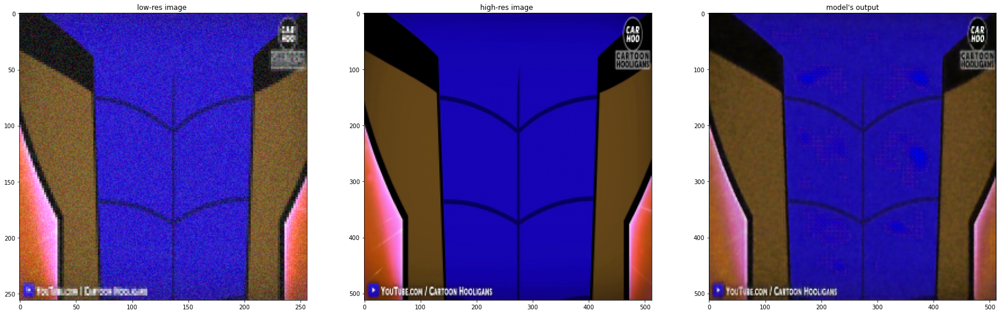

<Figure size 2880x2880 with 0 Axes>

In [33]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[200])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[200])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[200])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


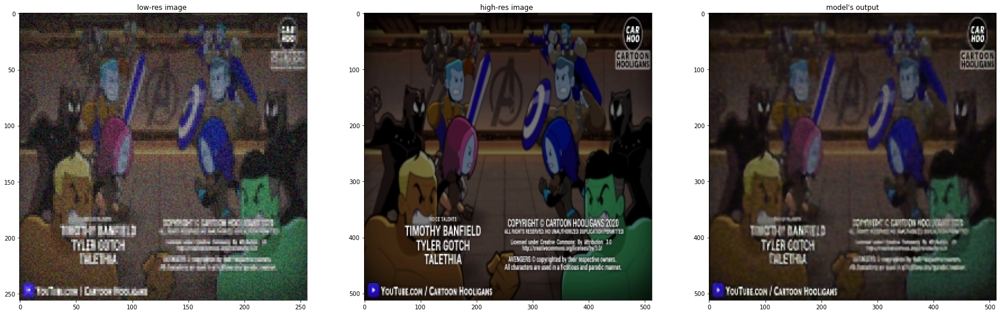

<Figure size 2880x2880 with 0 Axes>

In [34]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[50])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[50])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[50])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


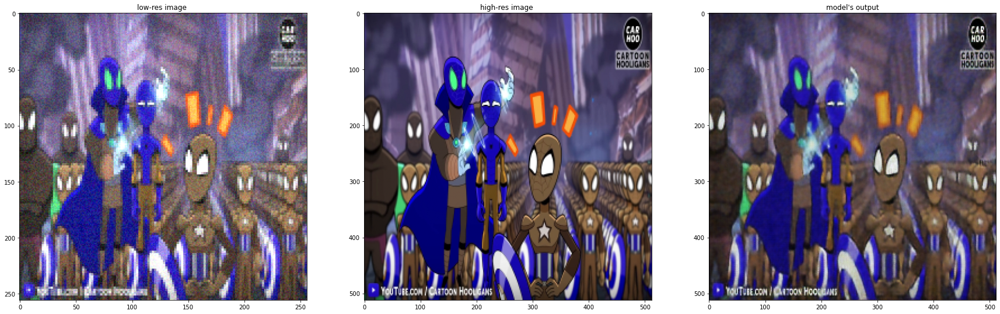

<Figure size 2880x2880 with 0 Axes>

In [35]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[35])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[35])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[35])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


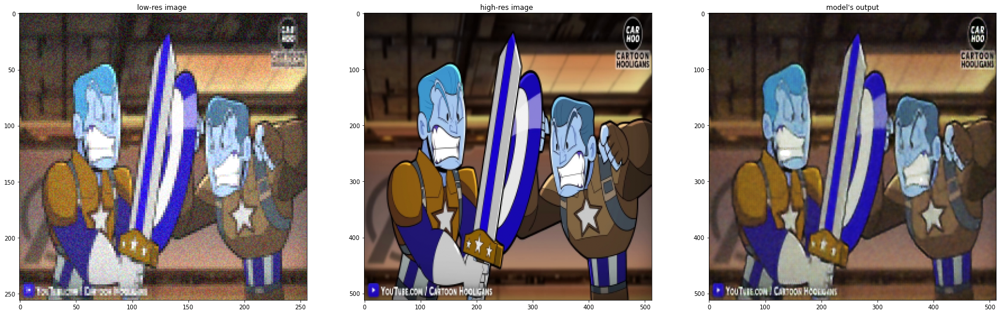

<Figure size 2880x2880 with 0 Axes>

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[120])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[120])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[120])
ax3.title.set_text("model's output")

In [ ]:
history_2= model_3.fit(train_x, train_y, validation_data =(val_x , val_y),epochs = 20, batch_size = 10, shuffle = True)

Train on 7000 samples, validate on 255 samples
Epoch 1/20
7000/7000 [==============================] - 783s 112ms/sample - loss: 0.0164 - val_loss: 0.0044
Epoch 2/20
7000/7000 [==============================] - 783s 112ms/sample - loss: 0.0164 - val_loss: 0.0062
Epoch 3/20
7000/7000 [==============================] - 782s 112ms/sample - loss: 0.0164 - val_loss: 0.0042
Epoch 4/20
7000/7000 [==============================] - 782s 112ms/sample - loss: 0.0156 - val_loss: 0.0034
Epoch 10/20
 520/7000 [=>............................] - ETA: 11:53 - loss: 0.0155

In [ ]:
model_3.save('CNN_06_01_512_BN')

In [42]:
ten= model_3.predict(val_x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


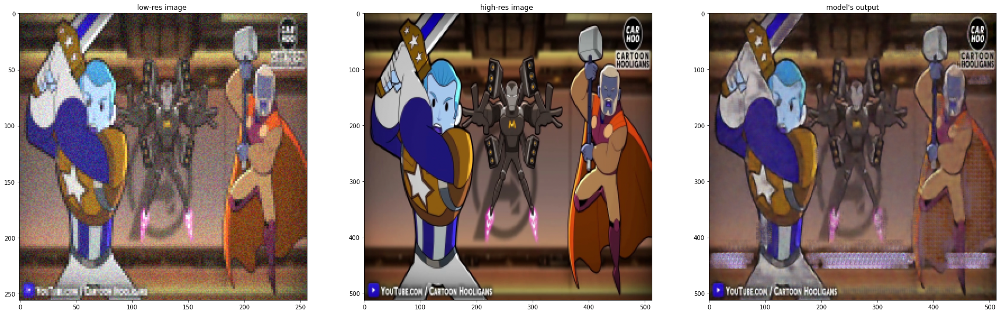

<Figure size 2880x2880 with 0 Axes>

In [43]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[100])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[100])
ax2.title.set_text("high-res image ")
ax3.imshow(ten[100])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


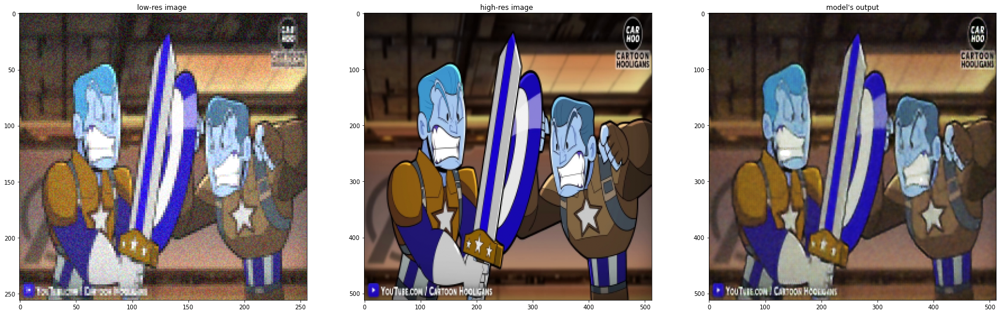

<Figure size 2880x2880 with 0 Axes>

In [44]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[120])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[120])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[120])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


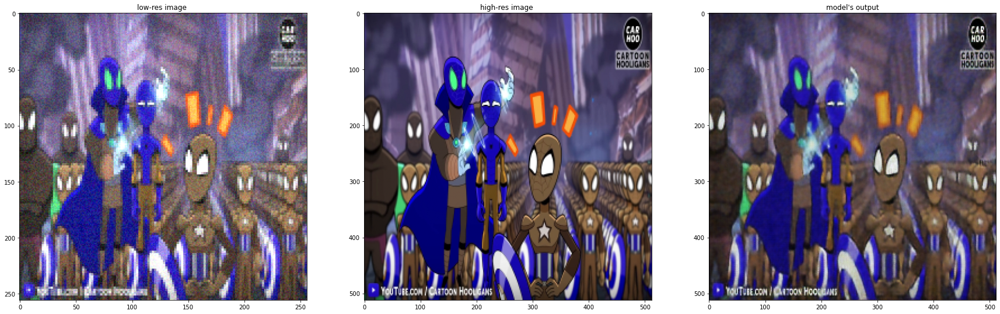

<Figure size 2880x2880 with 0 Axes>

In [45]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[35])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[35])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[35])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


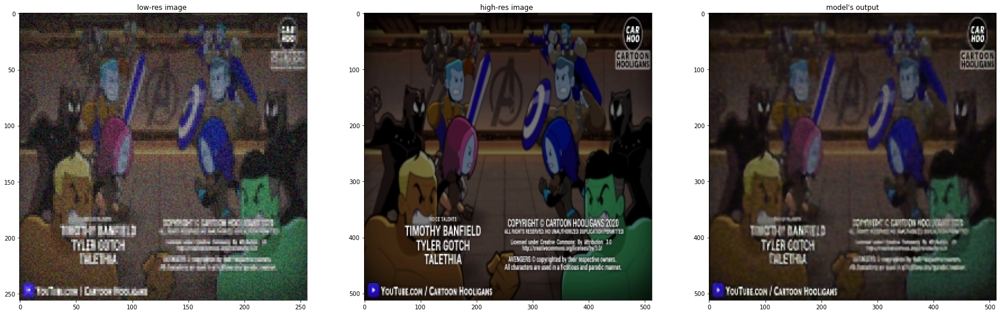

<Figure size 2880x2880 with 0 Axes>

In [46]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[50])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[50])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[50])
ax3.title.set_text("model's output")

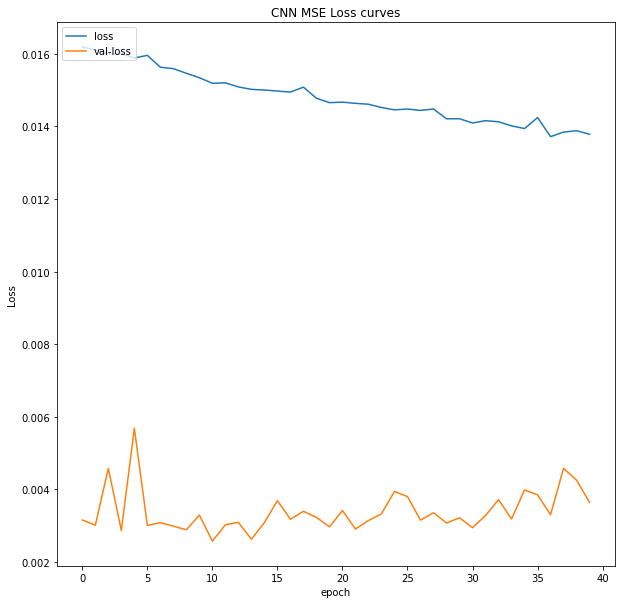

In [47]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_2.history['loss'])
plt.plot(history_2.history['val_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('CNN MSE Loss curves')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['loss','val-loss'], loc='upper left')
plt.show()